# Detección en imágenes de baja resolución GSD = 3 cm

In [91]:
# reshape images
img = imread("/home/paula/Documentos/PAULA/NOVENO SEMESTRE/imagenes/superresolution/reporte/figuras/grad_cam_comparison_all.png")
scale = 1200 / img.shape[1]
new_height = int(img.shape[0] * scale)
img = cv2.resize(img, (1200, new_height))
cv2.imwrite("/home/paula/Documentos/PAULA/NOVENO SEMESTRE/imagenes/superresolution/reporte/figuras/grad_cam_comparison_all.png", img)

[ WARN:0@12737.969] global grfmt_png.cpp:695 read_chunk chunk data is too large


True

In [1]:
from ultralytics import YOLO
import matplotlib.patches as patches
import cv2 
import numpy as np 
import matplotlib.pyplot as plt 
from PIL import Image 
import os
from yolo_cam.eigen_cam import EigenCAM  # paquete para usar gradcam
from yolo_cam.utils.image import show_cam_on_image, scale_cam_image


import warnings 
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')  # Suppress Matplotlib warnings
plt.rcParams["figure.figsize"] = [3.0, 3.0]

In [82]:
def plot_bboxes_pred(ax, image, bboxes):
    ax.imshow(image)
    for bbox in bboxes:
        x_min, y_min, x_max, y_max = bbox.cpu().numpy()
        rect = patches.Rectangle(
            (x_min, y_min),
            x_max - x_min,
            y_max - y_min,
            linewidth=2,
            edgecolor='red',
            facecolor='none'
        )
        ax.add_patch(rect)
    ax.set_title("Detecciones")
    ax.axis("off")

def print_grad_cam(ax1, ax2, model, img_path, target_layers):
    img = cv2.imread(img_path)
    #img = cv2.resize(img, (640, 640))
    rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    input_img = np.float32(rgb_img) / 255.0

    results = model(rgb_img)
    cam = EigenCAM(model, target_layers, task='od')
    grayscale_cam = cam(rgb_img)[0, :, :]
    cam_image = show_cam_on_image(input_img, grayscale_cam, use_rgb=True)

    plot_bboxes_pred(ax1, rgb_img, results[0].boxes.xyxy)
    ax2.imshow(cam_image)
    ax2.set_title("Grad-CAM")
    ax2.axis("off")


def load_boxes_as_xyxy(boxes_path, image_width, image_height):
    boxes = []
    with open(boxes_path, 'r') as f:
        for line in f:
            if line.strip():
                class_id, x_center, y_center, w, h = map(float, line.strip().split())
                # Convert from normalized YOLO format to absolute pixel XYXY
                xmin = (x_center - w / 2) * image_width
                ymin = (y_center - h / 2) * image_height
                xmax = (x_center + w / 2) * image_width
                ymax = (y_center + h / 2) * image_height
                boxes.append([xmin, ymin, xmax, ymax])
    return np.array(boxes)

def plot_bboxes(ax, image, bboxes):
    ax.imshow(image)
    for bbox in bboxes:
        x_min, y_min, x_max, y_max = bbox
        rect = patches.Rectangle(
            (x_min, y_min), x_max - x_min , y_max - y_min,
            linewidth=2,
            edgecolor='red',
            facecolor='none'
        )
        ax.add_patch(rect)
    ax.set_title("Bounding Boxes")
    ax.axis("off")

def print_images_and_boxes(ax, img_path):
    img = cv2.imread(img_path)
    img = cv2.resize(img, (512, 512))
    rgb_img = img.copy()
    img = np.float32(img) / 255
    boxes = load_boxes_as_xyxy(img_path.replace('.png', '.txt').replace('/images/', '/labels/'), img.shape[1], img.shape[0])
    plot_bboxes(ax, img, boxes)


def imread(img_path):
  img = cv2.imread(img_path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  return img


## Métricas de detección

El modleo Yolov11 fue entrenado con transferencia de aprendizaje en un dataset de frailejones de resolución de 1cm por pixel. Vamos a comparar su desempeño en imagenes con una resolución mucho menor de 3.3 cm/pixel

In [3]:
%cd "/home/paula/Documentos/PAULA/NOVENO SEMESTRE/imagenes/superresolution"

/home/paula/Documentos/PAULA/NOVENO SEMESTRE/imagenes/superresolution


In [4]:
model_path = './weights/yolov11_finetune_frailejones.pt'
model = YOLO(model_path)

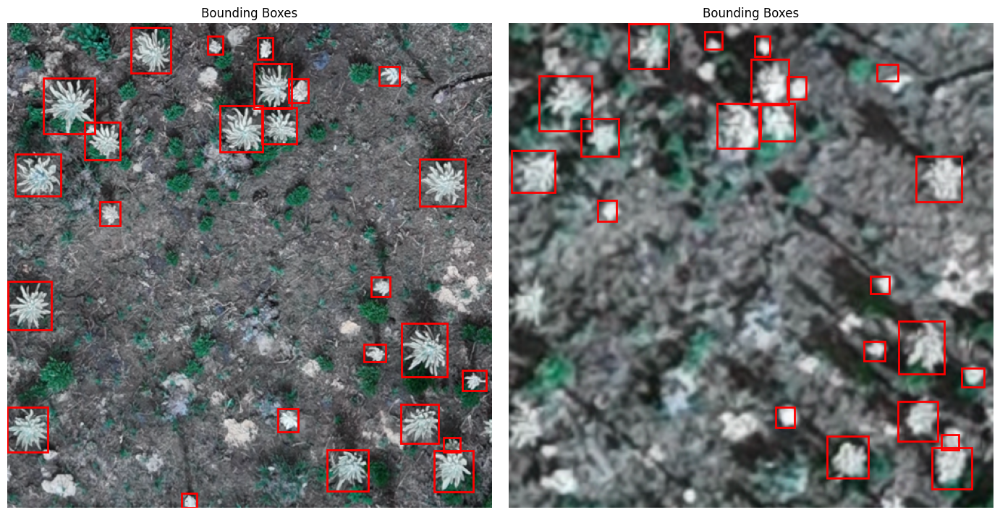

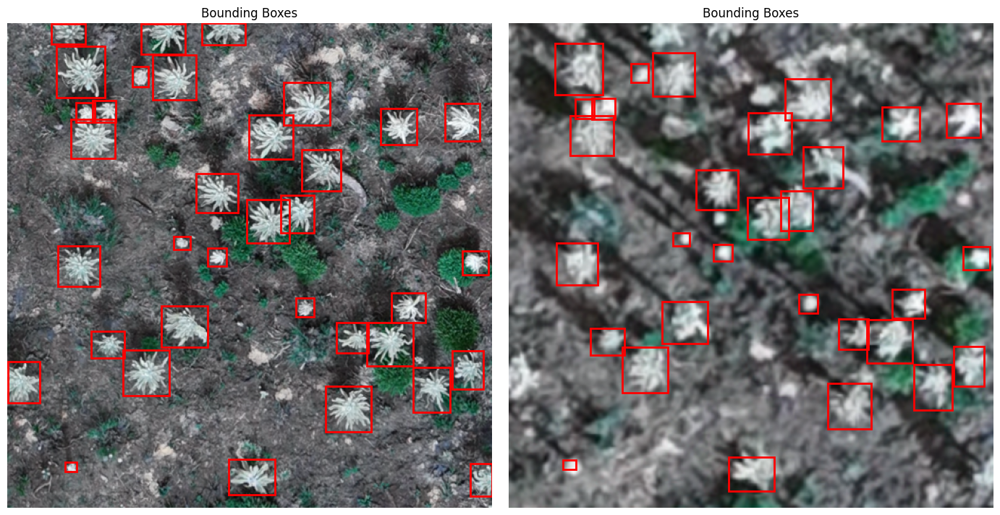

In [5]:
# Algunas imágenes del dataset de 1cm y de 3cm
images_1cm_path = "dataset/19_dic_2024_test_area_1cm/dataset/images"
images_3cm_path = "dataset/19_dic_2024_test_area_3cm/dataset/images"

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 7))
print_images_and_boxes(ax1, os.path.join(images_1cm_path, "tile_461_461.png"))
print_images_and_boxes(ax2, os.path.join(images_3cm_path, "tile_174_174.png"))
plt.tight_layout()
plt.show()



fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 7))
print_images_and_boxes(ax1, os.path.join(images_1cm_path, "tile_2305_461.png"))
print_images_and_boxes(ax2, os.path.join(images_3cm_path, "tile_870_174.png"))
plt.tight_layout()
plt.show()

In [141]:
yaml_1cm = "./yaml_files/config_19_dic_1cm.yaml"
yaml_3cm = "./yaml_files/config_19_dic_3cm.yaml"

In [149]:
# Validate with a custom dataset
metrics = model.val(data=yaml_1cm)
# this is what needs to be saved at the end
print("Metrics for 1cm dataset:")
print(metrics.results_dict)

metrics = model.val(data=yaml_3cm)
print("Metrics for 3cm dataset:")
print(metrics.results_dict)

Ultralytics 8.3.146 🚀 Python-3.11.11 torch-2.7.0+cu126 CPU (AMD Ryzen 7 3700U with Radeon Vega Mobile Gfx)
val: Fast image access ✅ (ping: 0.1±0.0 ms, read: 2488.0±572.1 MB/s, size: 9907.1 KB)


val: Scanning /home/paula/Documentos/PAULA/NOVENO SEMESTRE/imagenes/superresolution/dataset/19_dic_2024_test_area_1cm/dataset/labels.cache... 180 images, 51 backgrounds, 0 corrupt: 100%|██████████| 231/231 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:44<00:00,  2.98s/it]


                   all        231       3042      0.908      0.852      0.928       0.62
Speed: 1.7ms preprocess, 102.0ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs/detect/val4
Metrics for 1cm dataset:
{'metrics/precision(B)': np.float64(0.9075740354160032), 'metrics/recall(B)': np.float64(0.8517422748191978), 'metrics/mAP50(B)': np.float64(0.9282027204128147), 'metrics/mAP50-95(B)': np.float64(0.6204497509875176), 'fitness': np.float64(0.6512250479300474)}
Ultralytics 8.3.146 🚀 Python-3.11.11 torch-2.7.0+cu126 CPU (AMD Ryzen 7 3700U with Radeon Vega Mobile Gfx)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1308.5±1316.5 MB/s, size: 458.0 KB)


val: Scanning /home/paula/Documentos/PAULA/NOVENO SEMESTRE/imagenes/superresolution/dataset/19_dic_2024_test_area_3cm/dataset/labels... 120 images, 111 backgrounds, 0 corrupt: 100%|██████████| 231/231 [00:00<00:00, 331.32it/s]

val: New cache created: /home/paula/Documentos/PAULA/NOVENO SEMESTRE/imagenes/superresolution/dataset/19_dic_2024_test_area_3cm/dataset/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:27<00:00,  1.82s/it]


                   all        231       1782      0.243      0.301      0.196     0.0698
Speed: 1.8ms preprocess, 100.8ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/detect/val5
Metrics for 3cm dataset:
{'metrics/precision(B)': np.float64(0.24295227206855752), 'metrics/recall(B)': np.float64(0.30078563411896747), 'metrics/mAP50(B)': np.float64(0.19583499491360973), 'metrics/mAP50-95(B)': np.float64(0.06978003023341497), 'fitness': np.float64(0.08238552670143445)}


A partir de los resultados vemos claramente que el modelo de menor resolución, 3cm por pixel tiene un desempeño terrible en la tarea de detección de frailehones. Con la mayoría de detecciones siendo Falsos positivos, es decir el modelo esta confundiendo el suelo con los frailejones

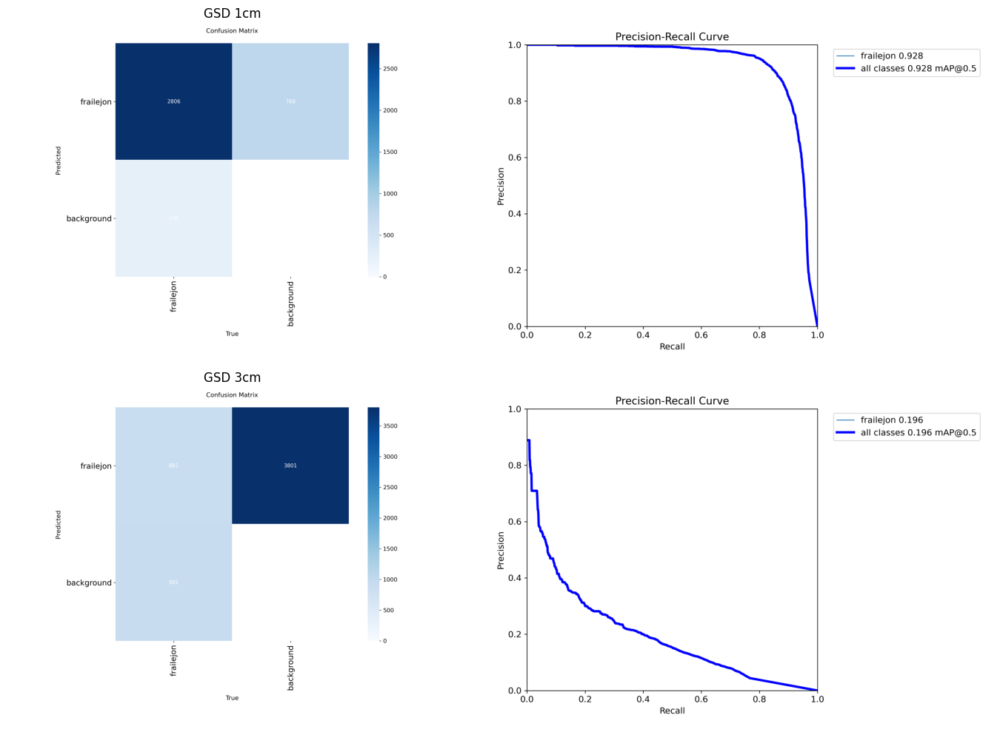

In [92]:
# print confusion matrix for them both
plt.figure(figsize=(14, 10))
plt.subplot(2,2,1); plt.imshow(imread("./runs/detect/val_1cm_test/confusion_matrix.png")); plt.title("GSD 1cm"); plt.axis('off')
plt.subplot(2,2,2); plt.imshow(imread("./runs/detect/val_1cm_test/PR_curve.png")); plt.axis('off')

plt.subplot(2,2,3);plt.imshow(imread("./runs/detect/val_3cm_test/confusion_matrix.png")); plt.title("GSD 3cm");plt.axis('off')
plt.subplot(2,2,4);plt.imshow(imread("./runs/detect/val_3cm_test/PR_curve.png")); plt.axis('off')

plt.tight_layout()
plt.savefig("confusion_matrix_pr_curves.png")
plt.show()

## Superresolución

Para obtener las imágenes con superresolución se ejecutó el notebook `Inferencia_Superresolution.ipynb` en Google Colab. Las imágenes obtenidas se guardaron en la carpeta super y super_train dentro de la carpeta del dataset de GSD 3cm de testeo. 


In [166]:
import shutil
# creemos un dataset de 3cm con interpolación bicubica para comparar
for i in os.listdir(images_3cm_path):
    img = cv2.imread(os.path.join(images_3cm_path, i))
    img_resized = cv2.resize(img, (512, 512), interpolation=cv2.INTER_CUBIC)
    bicubic_path = "dataset/19_dic_2024_test_area_3cm/dataset/images_bicubic/images"
    if not os.path.exists(bicubic_path):
        os.makedirs(bicubic_path)
    cv2.imwrite(os.path.join(bicubic_path, i ), img_resized)

# hacer una copia de labels en esta nueva carpeta
labels_bicubic_path = "dataset/19_dic_2024_test_area_3cm/dataset/images_bicubic/labels"

shutil.copytree(images_3cm_path.replace('images', 'labels'), labels_bicubic_path)

'dataset/19_dic_2024_test_area_3cm/dataset/images_bicubic/labels'

Veamos una comparación de las imagenes de 1cm, 3cm y con superresolución

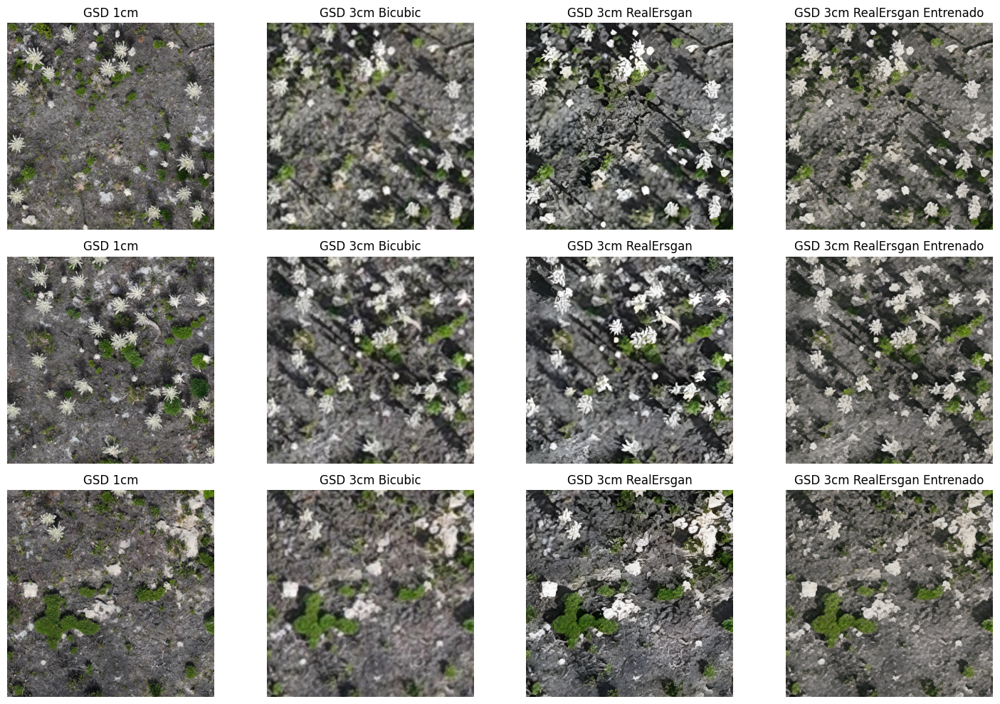

In [101]:
# Algunas imágenes del dataset de 1cm y de 3cm
images_1cm_path = "dataset/19_dic_2024_test_area_1cm/dataset/images"
images_3cm_path = "dataset/19_dic_2024_test_area_3cm/dataset/images"
images_3cm_path_bicubic = "dataset/19_dic_2024_test_area_3cm/dataset/images_bicubic/images"
images_3cm_path_realersgan = "dataset/19_dic_2024_test_area_3cm/dataset/super/images"
images_3cm_path_realersgan_train = "dataset/19_dic_2024_test_area_3cm/dataset/super_train/images"


plt.figure(figsize=(15, 10))
plt.subplot(3, 4, 1); plt.imshow(imread(os.path.join(images_1cm_path, "tile_461_461.png"))); plt.title("GSD 1cm"); plt.axis('off')
plt.subplot(3, 4, 2); plt.imshow(imread(os.path.join(images_3cm_path_bicubic, "tile_174_174.png"))); plt.title("GSD 3cm Bicubic"); plt.axis('off')
plt.subplot(3, 4, 3); plt.imshow(imread(os.path.join(images_3cm_path_realersgan, "tile_174_174.png"))); plt.title("GSD 3cm RealErsgan"); plt.axis('off')
plt.subplot(3, 4, 4); plt.imshow(imread(os.path.join(images_3cm_path_realersgan_train, "tile_174_174.png"))); plt.title("GSD 3cm RealErsgan Entrenado"); plt.axis('off')



plt.subplot(3, 4, 5); plt.imshow(imread(os.path.join(images_1cm_path, "tile_2305_461.png"))); plt.title("GSD 1cm"); plt.axis('off')
plt.subplot(3, 4, 6); plt.imshow(imread(os.path.join(images_3cm_path_bicubic, "tile_870_174.png"))); plt.title("GSD 3cm Bicubic"); plt.axis('off')
plt.subplot(3, 4, 7); plt.imshow(imread(os.path.join(images_3cm_path_realersgan, "tile_870_174.png"))); plt.title("GSD 3cm RealErsgan"); plt.axis('off')
plt.subplot(3, 4, 8); plt.imshow(imread(os.path.join(images_3cm_path_realersgan_train, "tile_870_174.png"))); plt.title("GSD 3cm RealErsgan Entrenado"); plt.axis('off')

plt.subplot(3, 4, 9); plt.imshow(imread(os.path.join(images_1cm_path, "tile_2766_922.png"))); plt.title("GSD 1cm"); plt.axis('off')
plt.subplot(3, 4, 10); plt.imshow(imread(os.path.join(images_3cm_path_bicubic, "tile_1044_348.png"))); plt.title("GSD 3cm Bicubic"); plt.axis('off')
plt.subplot(3, 4, 11); plt.imshow(imread(os.path.join(images_3cm_path_realersgan, "tile_1044_348.png"))); plt.title("GSD 3cm RealErsgan"); plt.axis('off')
plt.subplot(3, 4, 12); plt.imshow(imread(os.path.join(images_3cm_path_realersgan_train, "tile_1044_348.png"))); plt.title("GSD 3cm RealErsgan Entrenado"); plt.axis('off')


plt.tight_layout()
plt.savefig("comparacion_super.png")
plt.show()

## Prueba de detección de frailejones con Superresolución

In [8]:
# Create YAML files for the new datasets
bicubic_yaml = "./yaml_files/config_19_dic_3cm_bicubic.yaml"
super_yaml = "./yaml_files/config_19_dic_3cm_super.yaml"
super_train_yaml = "./yaml_files/config_19_dic_3cm_super_train.yaml"

# Define the content for each YAML file
bicubic_yaml_content = f"""
path: "/home/paula/Documentos/PAULA/NOVENO SEMESTRE/imagenes/superresolution/"
train: dataset/19_dic_2024_test_area_3cm/dataset/images_bicubic/images
val: dataset/19_dic_2024_test_area_3cm/dataset/images_bicubic/images
nc: 1
names: ['frailejones']
"""

super_yaml_content = f"""
path: "/home/paula/Documentos/PAULA/NOVENO SEMESTRE/imagenes/superresolution/"
train: dataset/19_dic_2024_test_area_3cm/dataset/super/images
val: dataset/19_dic_2024_test_area_3cm/dataset/super/images
nc: 1
names: ['frailejones']
"""

super_train_yaml_content = f"""
path: "/home/paula/Documentos/PAULA/NOVENO SEMESTRE/imagenes/superresolution/"
train: dataset/19_dic_2024_test_area_3cm/dataset/super_train/images
val: dataset/19_dic_2024_test_area_3cm/dataset/super_train/images
nc: 1
names: ['frailejones']
"""

# Write the YAML files
os.makedirs("./yaml_files", exist_ok=True)

with open(bicubic_yaml, "w") as f:
    f.write(bicubic_yaml_content)

with open(super_yaml, "w") as f:
    f.write(super_yaml_content)

with open(super_train_yaml, "w") as f:
    f.write(super_train_yaml_content)

print("YAML files created successfully.")


# ejecutar metricas con el dataset super aqui

# Validate with a custom dataset
metrics = model.val(data=bicubic_yaml)
# this is what needs to be saved at the end
print("Metrics for 1cm dataset:")
print(metrics.results_dict)

metrics = model.val(data=super_yaml)
print("Metrics for 3cm dataset:")
print(metrics.results_dict)

metrics = model.val(data=super_train_yaml)
print("Metrics for 3cm dataset:")
print(metrics.results_dict)

YAML files created successfully.
Ultralytics 8.3.146 🚀 Python-3.11.11 torch-2.7.0+cu126 CPU (AMD Ryzen 7 3700U with Radeon Vega Mobile Gfx)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1150.4±89.2 MB/s, size: 424.8 KB)


val: Scanning /home/paula/Documentos/PAULA/NOVENO SEMESTRE/imagenes/superresolution/dataset/19_dic_2024_test_area_3cm/dataset/images_bicubic/labels.cache... 60 images, 17 backgrounds, 0 corrupt: 100%|██████████| 77/77 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:16<00:00,  3.24s/it]


                   all         77        891      0.601      0.532      0.526      0.171
Speed: 3.4ms preprocess, 170.9ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/detect/val5
Metrics for 1cm dataset:
{'metrics/precision(B)': np.float64(0.6012410517226949), 'metrics/recall(B)': np.float64(0.531986531986532), 'metrics/mAP50(B)': np.float64(0.525630113348988), 'metrics/mAP50-95(B)': np.float64(0.17148106494986795), 'fitness': np.float64(0.20689596978977995)}
Ultralytics 8.3.146 🚀 Python-3.11.11 torch-2.7.0+cu126 CPU (AMD Ryzen 7 3700U with Radeon Vega Mobile Gfx)
val: Fast image access ✅ (ping: 0.1±0.0 ms, read: 755.7±291.9 MB/s, size: 635.0 KB)


val: Scanning /home/paula/Documentos/PAULA/NOVENO SEMESTRE/imagenes/superresolution/dataset/19_dic_2024_test_area_3cm/dataset/super/labels.cache... 60 images, 17 backgrounds, 0 corrupt: 100%|██████████| 77/77 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:16<00:00,  3.22s/it]


                   all         77        891       0.59      0.549      0.541      0.196
Speed: 3.4ms preprocess, 163.0ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/val6
Metrics for 3cm dataset:
{'metrics/precision(B)': np.float64(0.5897883949510415), 'metrics/recall(B)': np.float64(0.5486427403285612), 'metrics/mAP50(B)': np.float64(0.5411939254994608), 'metrics/mAP50-95(B)': np.float64(0.19588310528342753), 'fitness': np.float64(0.23041418730503085)}
Ultralytics 8.3.146 🚀 Python-3.11.11 torch-2.7.0+cu126 CPU (AMD Ryzen 7 3700U with Radeon Vega Mobile Gfx)
val: Fast image access ✅ (ping: 0.1±0.0 ms, read: 1118.8±176.9 MB/s, size: 577.8 KB)


val: Scanning /home/paula/Documentos/PAULA/NOVENO SEMESTRE/imagenes/superresolution/dataset/19_dic_2024_test_area_3cm/dataset/super_train/labels... 60 images, 17 backgrounds, 0 corrupt: 100%|██████████| 77/77 [00:00<00:00, 166.98it/s]

val: New cache created: /home/paula/Documentos/PAULA/NOVENO SEMESTRE/imagenes/superresolution/dataset/19_dic_2024_test_area_3cm/dataset/super_train/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:19<00:00,  3.86s/it]


                   all         77        891      0.282      0.282      0.142     0.0414
Speed: 4.6ms preprocess, 182.9ms inference, 0.0ms loss, 4.4ms postprocess per image
Results saved to runs/detect/val7
Metrics for 3cm dataset:
{'metrics/precision(B)': np.float64(0.2817957393212316), 'metrics/recall(B)': np.float64(0.28170594837261503), 'metrics/mAP50(B)': np.float64(0.14231985049845378), 'metrics/mAP50-95(B)': np.float64(0.04135665489379327), 'fitness': np.float64(0.05145297445425932)}


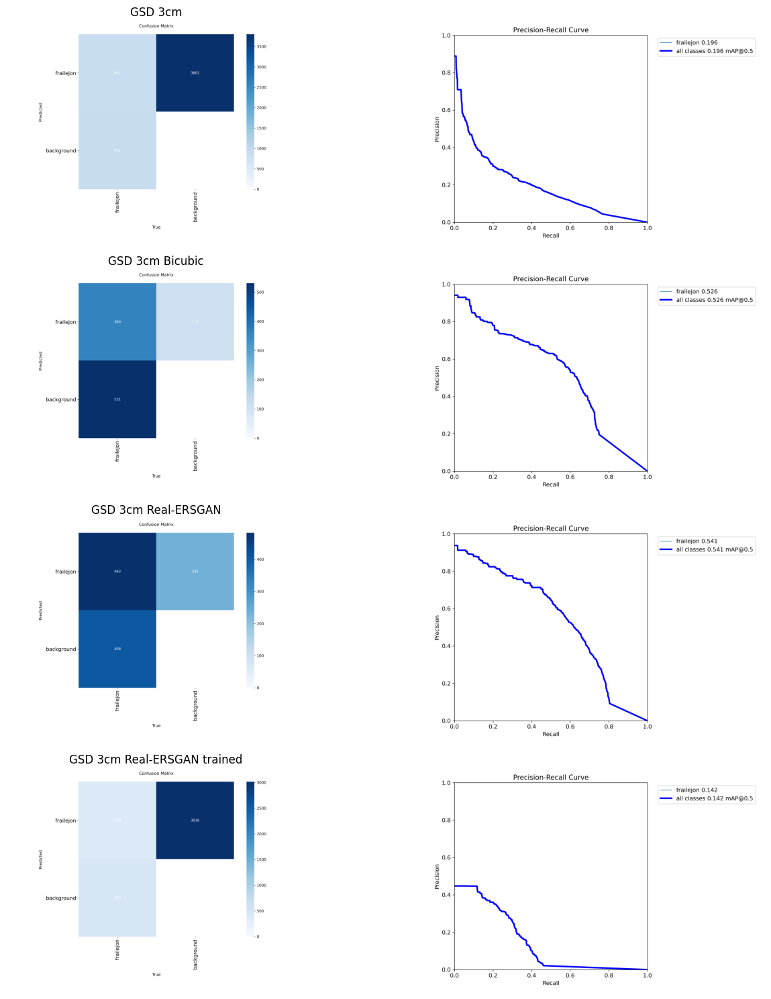

In [94]:
plt.figure(figsize=(15, 15))
plt.subplot(4,2,1); plt.imshow(imread("./runs/detect/val_3cm_test/confusion_matrix.png")); plt.title("GSD 3cm"); plt.axis('off')
plt.subplot(4,2,2); plt.imshow(imread("./runs/detect/val_3cm_test/PR_curve.png")); plt.axis('off')

plt.subplot(4,2,3);plt.imshow(imread("./runs/detect/val_3cm_bicubic/confusion_matrix.png")); plt.title("GSD 3cm Bicubic");plt.axis('off')
plt.subplot(4,2,4);plt.imshow(imread("./runs/detect/val_3cm_bicubic/PR_curve.png")); plt.axis('off')

plt.subplot(4,2,5);plt.imshow(imread("./runs/detect/val_3cm_ersgan/confusion_matrix.png")); plt.title("GSD 3cm Real-ERSGAN");plt.axis('off')
plt.subplot(4,2,6);plt.imshow(imread("./runs/detect/val_3cm_ersgan/PR_curve.png")); plt.axis('off')

plt.subplot(4,2,7);plt.imshow(imread("./runs/detect/val_3cm_ersgan_train/confusion_matrix.png")); plt.title("GSD 3cm Real-ERSGAN trained");plt.axis('off')
plt.subplot(4,2,8);plt.imshow(imread("./runs/detect/val_3cm_ersgan_train/PR_curve.png")); plt.axis('off')

plt.tight_layout()
plt.savefig("confusion_matrix_pr_curves_super_reconstruct.png")
plt.show()

## Grad-Cam para modelo de detección de objetos

Grad-CAM (Gradient-weighted Class Activation Mapping) es una técnica de visualización para redes neuronales convolucionales (CNNs) que permite interpretar en qué regiones de una imagen se enfocó el modelo para tomar una decisión.


Cuando los modelos inspirados en transformers visuales (ViT), que tienen capas de atención, se pueden usar alternativas para ver la relación entre las tokens obtenidos de la atención y las activaciones de la imagen. 

Este repostorio [https://github-com.translate.goog/rigvedrs/YOLO-V11-CAM?_x_tr_sl=en&_x_tr_tl=es&_x_tr_hl=es&_x_tr_pto=tc] utiliza SVD para extrar componentes proncipales y usar el vector de mayor varianza para proyectar las atcivaciones, luego hace un reshape para reconstruir una atención espacial. 

Utilizaremos el código de ese repositorio, con algunas modificaciones para mostrar el GradCam de la detección de frailejones

In [9]:
model = YOLO(model_path)
model = model.cpu()

In [10]:
# Vamos a imprimir las capas del modelo YOLOv11
for i, layer in enumerate(model.model.model):
    print(f"{i}: {layer}")


0: Conv(
  (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
  (bn): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
  (act): SiLU(inplace=True)
)
1: Conv(
  (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
  (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
  (act): SiLU(inplace=True)
)
2: C3k2(
  (cv1): Conv(
    (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
    (act): SiLU(inplace=True)
  )
  (cv2): Conv(
    (conv): Conv2d(48, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
    (act): SiLU(inplace=True)
  )
  (m): ModuleList(
    (0): Bottleneck(
      (cv1): Conv(
        (conv): Conv2d(16, 8, kernel_size=(3, 3), stride=(1, 1), padding=

La ultima capa, la capa 23 es la cabeza de detección, ahí se generan las cajas delimitadores. Nos interesa ver que pasa en las otras capas "el backnone" que es donde se generan los features. 

In [11]:
for name, module in model.named_modules():
    print(name, module)


 YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (2): C3k2(
        (cv1): Conv(
          (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(48, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running

In [89]:
target_layers = [
    #model.model.model[22].m[-1].m[-1].cv1,
    model.model.model[22]
]

In [87]:
target_layers

[Conv(
   (conv): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   (act): SiLU(inplace=True)
 )]

Veamos que el grad cam del modelo en su ultima capa del backbone en las imágenes de GSD 3cm


0: 512x512 (no detections), 164.8ms
Speed: 2.9ms preprocess, 164.8ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 (no detections), 121.3ms
Speed: 4.5ms preprocess, 121.3ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 (no detections), 114.7ms
Speed: 5.8ms preprocess, 114.7ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 (no detections), 143.4ms
Speed: 4.7ms preprocess, 143.4ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 1 frailejon, 186.9ms
Speed: 1.8ms preprocess, 186.9ms inference, 1.3ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 1 frailejon, 202.2ms
Speed: 5.2ms preprocess, 202.2ms inference, 3.0ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 1 frailejon, 177.6ms
Speed: 2.7ms preprocess, 177.6ms inference, 2.1ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 1 frailejon, 175.4ms
Speed: 4.7ms preprocess, 175.4ms i

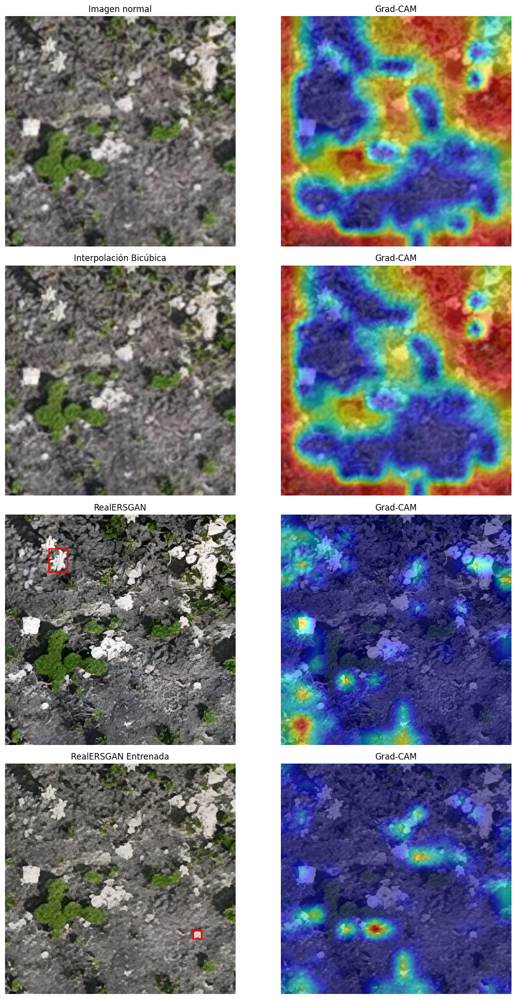

In [102]:
fig, axes = plt.subplots(4, 2, figsize=(12, 20))

print_grad_cam(axes[0][0], axes[0][1], model, "./dataset/19_dic_2024_test_area_3cm/dataset/images/tile_1044_348.png", target_layers)
axes[0][0].set_title("Imagen normal")

print_grad_cam(axes[1][0], axes[1][1], model, "./dataset/19_dic_2024_test_area_3cm/dataset/images_bicubic/images/tile_1044_348.png", target_layers)
axes[1][0].set_title("Interpolación Bicúbica")

print_grad_cam(axes[2][0], axes[2][1], model, "./dataset/19_dic_2024_test_area_3cm/dataset/super/images/tile_1044_348.png", target_layers)
axes[2][0].set_title("RealERSGAN")

print_grad_cam(axes[3][0], axes[3][1], model, "./dataset/19_dic_2024_test_area_3cm/dataset/super_train/images/tile_1044_348.png", target_layers)
axes[3][0].set_title("RealERSGAN Entrenada")

plt.tight_layout()
plt.savefig("grad_cam_comparison1.png")

plt.show()


0: 512x512 2 frailejons, 243.1ms
Speed: 5.8ms preprocess, 243.1ms inference, 1.8ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 2 frailejons, 243.6ms
Speed: 2.9ms preprocess, 243.6ms inference, 2.4ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 2 frailejons, 355.4ms
Speed: 5.1ms preprocess, 355.4ms inference, 1.8ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 2 frailejons, 124.0ms
Speed: 4.6ms preprocess, 124.0ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 15 frailejons, 193.9ms
Speed: 3.9ms preprocess, 193.9ms inference, 2.3ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 15 frailejons, 122.7ms
Speed: 3.5ms preprocess, 122.7ms inference, 1.1ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 8 frailejons, 119.5ms
Speed: 3.3ms preprocess, 119.5ms inference, 1.4ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 8 frailejons, 163.4ms
Speed: 3.4ms preprocess, 163.4ms inferen

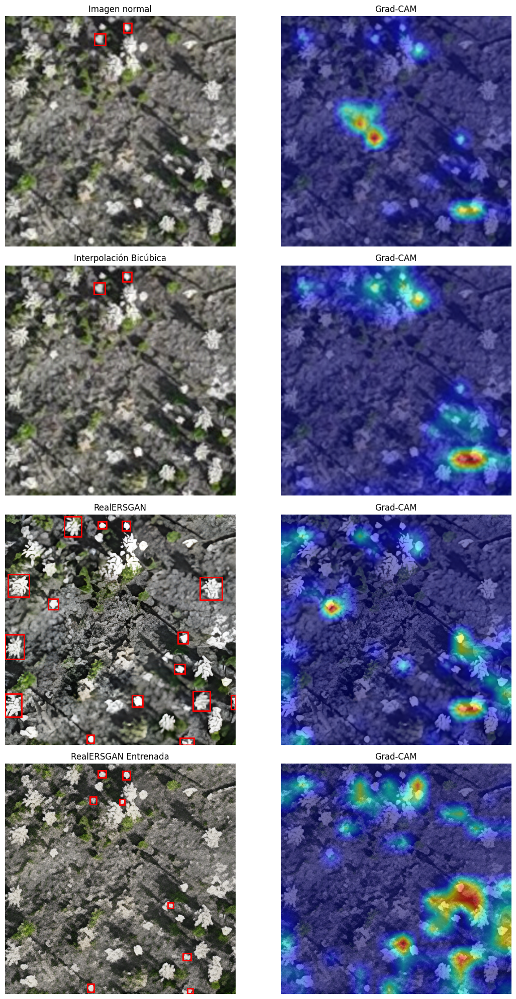

In [96]:
fig, axes = plt.subplots(4, 2, figsize=(12, 20))

print_grad_cam(axes[0][0], axes[0][1], model, "./dataset/19_dic_2024_test_area_3cm/dataset/images/tile_174_174.png", target_layers)
axes[0][0].set_title("Imagen normal")

print_grad_cam(axes[1][0], axes[1][1], model, "./dataset/19_dic_2024_test_area_3cm/dataset/images_bicubic/images/tile_174_174.png", target_layers)
axes[1][0].set_title("Interpolación Bicúbica")

print_grad_cam(axes[2][0], axes[2][1], model, "./dataset/19_dic_2024_test_area_3cm/dataset/super/images/tile_174_174.png", target_layers)
axes[2][0].set_title("RealERSGAN")

print_grad_cam(axes[3][0], axes[3][1], model, "./dataset/19_dic_2024_test_area_3cm/dataset/super_train/images/tile_174_174.png", target_layers)
axes[3][0].set_title("RealERSGAN Entrenada")


plt.tight_layout()
plt.savefig("grad_cam_comparison2.png")

plt.show()



0: 512x512 4 frailejons, 264.2ms
Speed: 5.1ms preprocess, 264.2ms inference, 2.5ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 4 frailejons, 201.4ms
Speed: 5.5ms preprocess, 201.4ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 4 frailejons, 379.0ms
Speed: 4.5ms preprocess, 379.0ms inference, 1.2ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 4 frailejons, 116.2ms
Speed: 2.4ms preprocess, 116.2ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 19 frailejons, 132.4ms
Speed: 3.6ms preprocess, 132.4ms inference, 1.8ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 19 frailejons, 99.7ms
Speed: 5.6ms preprocess, 99.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 7 frailejons, 284.1ms
Speed: 2.5ms preprocess, 284.1ms inference, 2.7ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 7 frailejons, 127.2ms
Speed: 3.5ms preprocess, 127.2ms inference

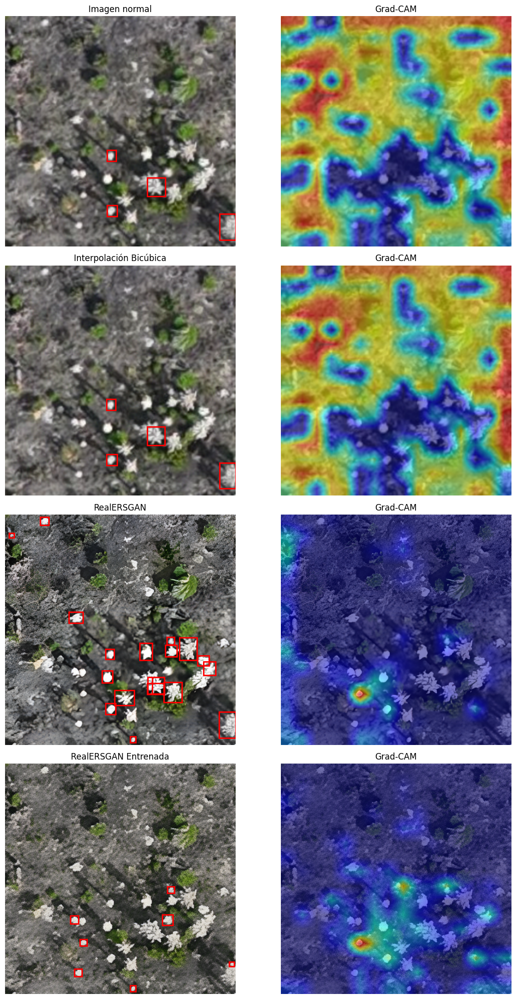

In [97]:
fig, axes = plt.subplots(4, 2, figsize=(12, 20))

print_grad_cam(axes[0][0], axes[0][1], model, "./dataset/19_dic_2024_test_area_3cm/dataset/images/tile_1044_522.png", target_layers)
axes[0][0].set_title("Imagen normal")

print_grad_cam(axes[1][0], axes[1][1], model, "./dataset/19_dic_2024_test_area_3cm/dataset/images_bicubic/images/tile_1044_522.png", target_layers)
axes[1][0].set_title("Interpolación Bicúbica")

print_grad_cam(axes[2][0], axes[2][1], model, "./dataset/19_dic_2024_test_area_3cm/dataset/super/images/tile_1044_522.png", target_layers)
axes[2][0].set_title("RealERSGAN")

print_grad_cam(axes[3][0], axes[3][1], model, "./dataset/19_dic_2024_test_area_3cm/dataset/super_train/images/tile_1044_522.png", target_layers)
axes[3][0].set_title("RealERSGAN Entrenada")

plt.tight_layout()
plt.savefig("grad_cam_comparison3.png")
plt.show()
